In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize']=20,10

import plotly.graph_objects as go
from keras.models import Sequential
from keras.layers import LSTM,Dropout,Dense
from sklearn.preprocessing import MinMaxScaler

import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv("MSFT.csv")
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.061751,1031788800
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.063956,308160000
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.065059,133171200
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.063405,67766400
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.062302,47894400


In [3]:
df.rename(columns = str.upper , inplace = True)


In [4]:
#CONVERTING STRING INTO DATE TIME SERIES

df['DATE'] = pd.to_datetime(df['DATE'] , format = "%Y-%m-%d")

In [5]:
df.head()

,DATE,OPEN,HIGH,LOW,CLOSE,ADJ CLOSE,VOLUME
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.061751,1031788800
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.063956,308160000
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.065059,133171200
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.063405,67766400
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.062302,47894400


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8857 entries, 0 to 8856
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   DATE       8857 non-null   datetime64[ns]
 1   OPEN       8857 non-null   float64       
 2   HIGH       8857 non-null   float64       
 3   LOW        8857 non-null   float64       
 4   CLOSE      8857 non-null   float64       
 5   ADJ CLOSE  8857 non-null   float64       
 6   VOLUME     8857 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 484.5 KB


In [7]:
df1=pd.read_csv("stock_data.csv")
df1.head()

,Date,Open,High,Low,Close,Volume,OpenInt,Stock
0,1984-09-07,0.42388,0.42902,0.41874,0.42388,23220030,0,AAPL
1,1984-09-10,0.42388,0.42516,0.41366,0.42134,18022532,0,AAPL
2,1984-09-11,0.42516,0.43668,0.42516,0.42902,42498199,0,AAPL
3,1984-09-12,0.42902,0.43157,0.41618,0.41618,37125801,0,AAPL
4,1984-09-13,0.43927,0.44052,0.43927,0.43927,57822062,0,AAPL


In [8]:
df1.rename(columns = str.upper , inplace = True)

In [9]:
#CONVERTING STRING INTO DATE TIME SERIES

df1['DATE'] = pd.to_datetime(df1['DATE'] , format = "%Y-%m-%d")

In [10]:
df1.head()

,DATE,OPEN,HIGH,LOW,CLOSE,VOLUME,OPENINT,STOCK
0,1984-09-07,0.42388,0.42902,0.41874,0.42388,23220030,0,AAPL
1,1984-09-10,0.42388,0.42516,0.41366,0.42134,18022532,0,AAPL
2,1984-09-11,0.42516,0.43668,0.42516,0.42902,42498199,0,AAPL
3,1984-09-12,0.42902,0.43157,0.41618,0.41618,37125801,0,AAPL
4,1984-09-13,0.43927,0.44052,0.43927,0.43927,57822062,0,AAPL


In [11]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19586 entries, 0 to 19585
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   DATE     19586 non-null  datetime64[ns]
 1   OPEN     19586 non-null  float64       
 2   HIGH     19586 non-null  float64       
 3   LOW      19586 non-null  float64       
 4   CLOSE    19586 non-null  float64       
 5   VOLUME   19586 non-null  int64         
 6   OPENINT  19586 non-null  int64         
 7   STOCK    19586 non-null  object        
dtypes: datetime64[ns](1), float64(4), int64(2), object(1)
memory usage: 1.2+ MB


## EDA of MSFT Dataset

In [12]:
d1 = df.copy()
d1

,DATE,OPEN,HIGH,LOW,CLOSE,ADJ CLOSE,VOLUME
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.061751,1031788800
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.063956,308160000
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.065059,133171200
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.063405,67766400
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.062302,47894400
...,...,...,...,...,...,...,...
8852,2021-04-27,261.579987,263.190002,260.119995,261.970001,261.970001,31014200
8853,2021-04-28,256.079987,256.540009,252.949997,254.559998,254.559998,46903100
8854,2021-04-29,255.460007,256.100006,249.000000,252.509995,252.509995,40589000
8855,2021-04-30,249.740005,253.080002,249.600006,252.179993,252.179993,30929200


In [13]:
d1 = d1.set_index('DATE')

In [14]:
feat = d1.columns

In [15]:
list(enumerate(feat))

[(0, 'OPEN'),
 (1, 'HIGH'),
 (2, 'LOW'),
 (3, 'CLOSE'),
 (4, 'ADJ CLOSE'),
 (5, 'VOLUME')]

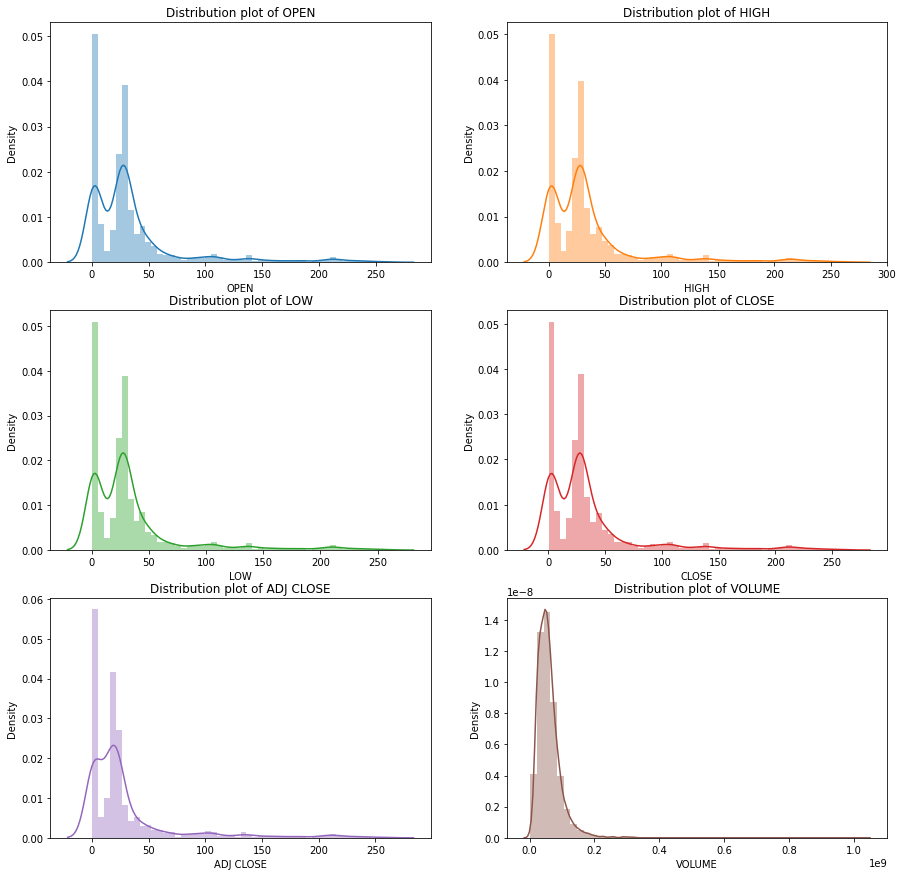

In [16]:
#creating distribution plots of various attributes

plt.figure(figsize=(15,15))         
for i in enumerate(feat):
    plt.subplot(3,2,i[0]+1)
    base_color = sns.color_palette()[i[0]]
    sns.distplot(x = d1[i[1]] , color = base_color)
    plt.xlabel(i[1]);
    plt.title(f'Distribution plot of {i[1]}')

Text(0.5, 0, 'DATE')

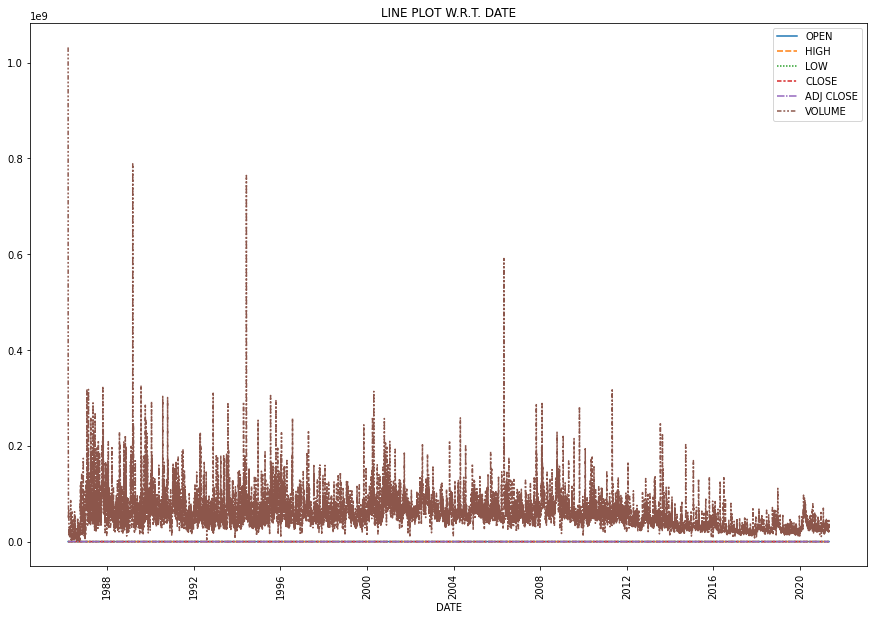

In [17]:
#plot of line plot btwn Date and various other attributes

plt.figure(figsize=(15,10))   
sns.lineplot(data = d1)
plt.xticks(rotation = 90);                   
plt.title("LINE PLOT W.R.T. DATE")
plt.xlabel("DATE")

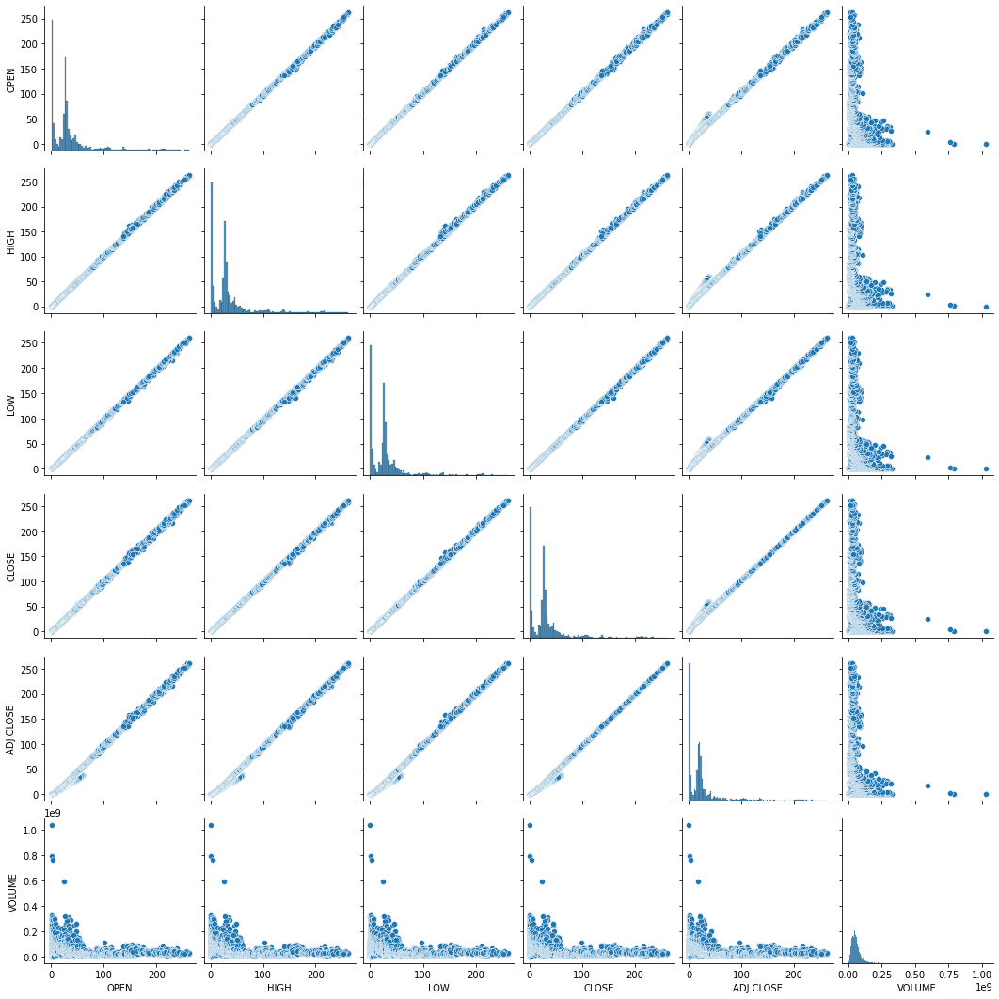

In [18]:
sns.pairplot(data = d1)      #Plots b/w various attributes

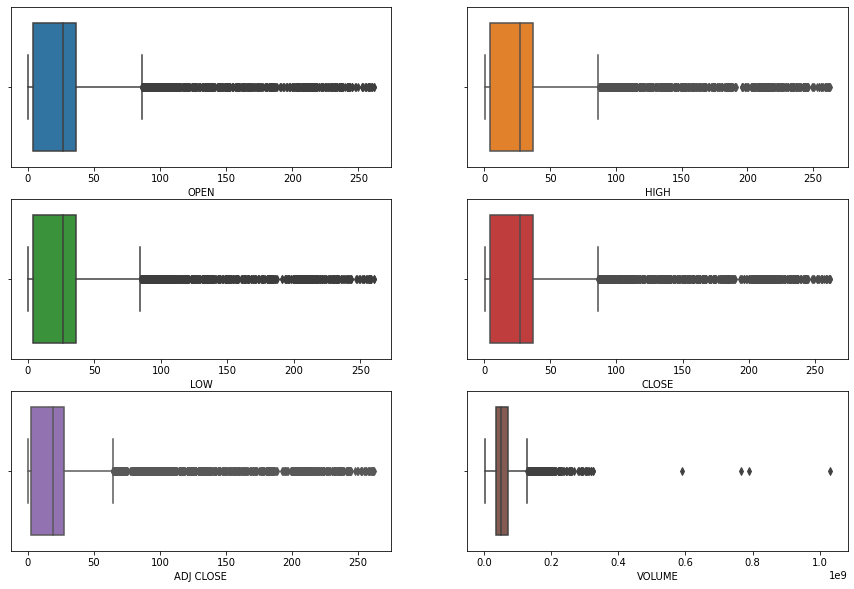

In [19]:
#creating Box plots of various attributes

plt.figure(figsize=(15,10))         
for i in enumerate(feat):
    plt.subplot(3,2,i[0]+1)
    base_color = sns.color_palette()[i[0]]
    sns.boxplot(x = d1[i[1]] , color = base_color)
    plt.xlabel(i[1]);

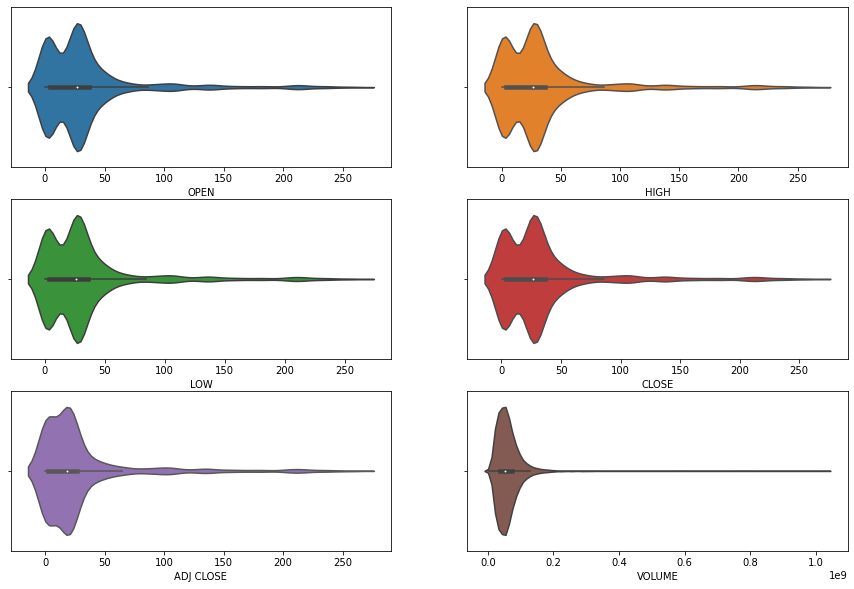

In [20]:
#creating Violin plots of various attributes

plt.figure(figsize=(15,10))         
for i in enumerate(feat):
    plt.subplot(3,2,i[0]+1)
    base_color = sns.color_palette()[i[0]]
    sns.violinplot(x = d1[i[1]] , color = base_color)
    plt.xlabel(i[1]);

<AxesSubplot:>

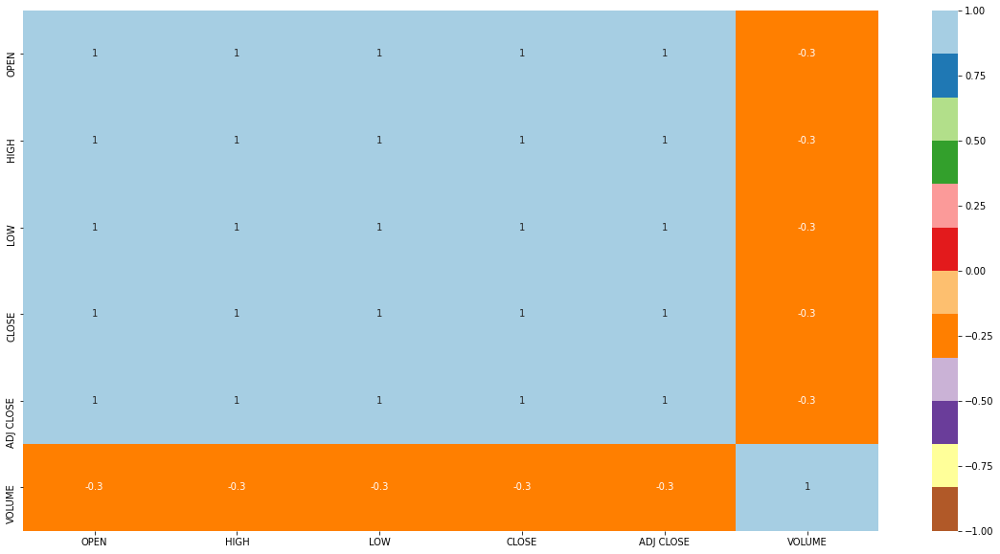

In [21]:
#heat map to determine correlation

sns.heatmap(d1.corr() , vmin = -1 , vmax = 1 , annot = True , cmap = 'Paired_r')     

In [22]:
#Candlestick plot

fig = go.Figure(data=[go.Candlestick(x=df['DATE'],
                open=df['OPEN'],
                high=df['HIGH'],
                low=df['LOW'],
                close=df['CLOSE'])])

fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

## EDA of  Stock_data

In [23]:
d2 = df1.copy()
d2

,DATE,OPEN,HIGH,LOW,CLOSE,VOLUME,OPENINT,STOCK
0,1984-09-07,0.42388,0.42902,0.41874,0.42388,23220030,0,AAPL
1,1984-09-10,0.42388,0.42516,0.41366,0.42134,18022532,0,AAPL
2,1984-09-11,0.42516,0.43668,0.42516,0.42902,42498199,0,AAPL
3,1984-09-12,0.42902,0.43157,0.41618,0.41618,37125801,0,AAPL
4,1984-09-13,0.43927,0.44052,0.43927,0.43927,57822062,0,AAPL
...,...,...,...,...,...,...,...,...
19581,2017-11-06,178.56000,180.45000,178.31000,180.17000,13275578,0,FB
19582,2017-11-07,180.50000,180.74800,179.40300,180.25000,12903836,0,FB
19583,2017-11-08,179.79000,180.35000,179.11000,179.56000,10467606,0,FB
19584,2017-11-09,178.31000,179.40000,177.09000,179.30000,12602188,0,FB


In [24]:
d2.columns
d2 = d2.set_index(['STOCK','DATE'])

In [25]:
feature = ['OPEN', 'HIGH', 'LOW', 'CLOSE']

In [26]:
list(enumerate(feature))

[(0, 'OPEN'), (1, 'HIGH'), (2, 'LOW'), (3, 'CLOSE')]

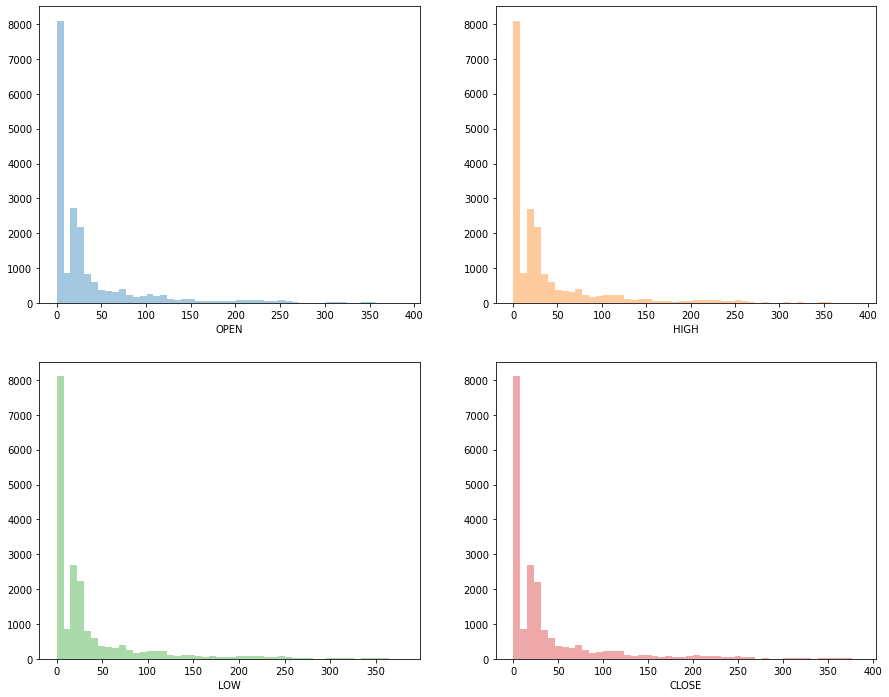

In [27]:
plt.figure(figsize=(15,12))
for i in enumerate(feature):
    plt.subplot(2,2,i[0]+1)
    base_color = sns.color_palette()[i[0]]
    sns.distplot(x = d2[i[1]] , kde = False , color = base_color)
    plt.xlabel(i[1]);

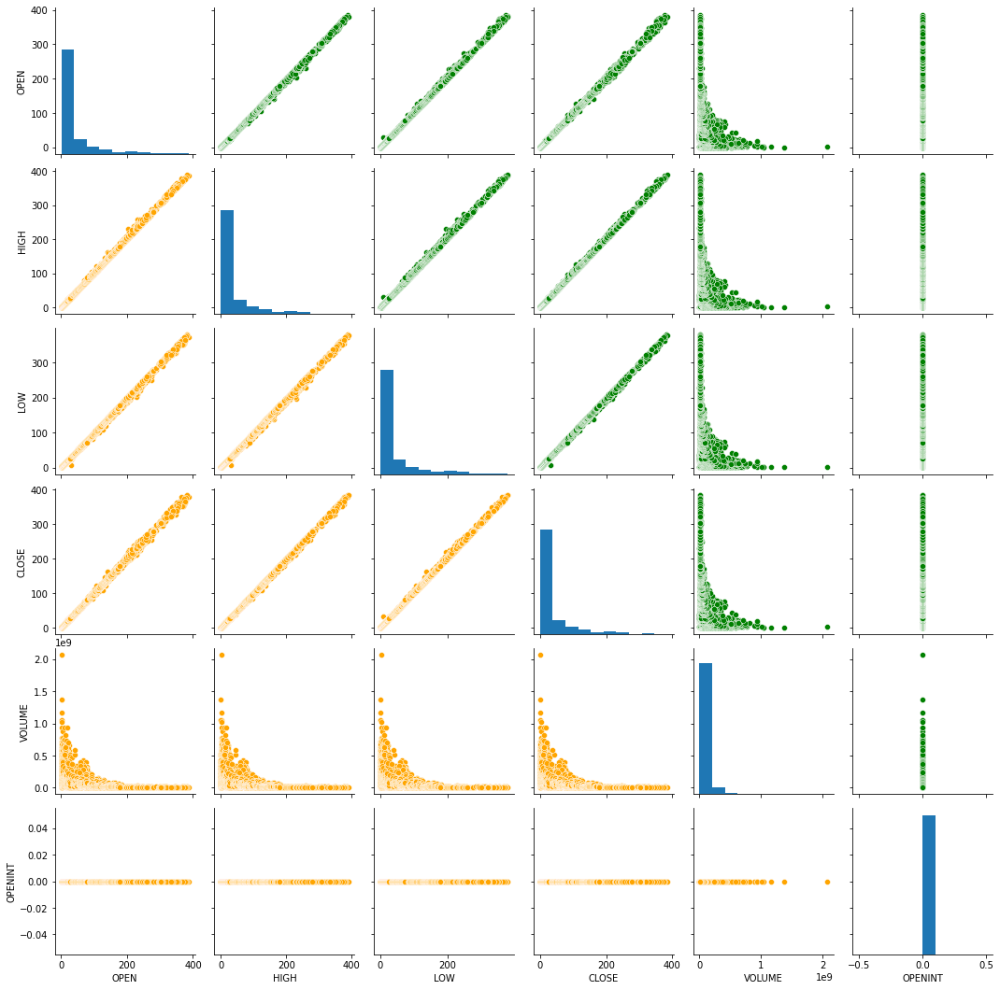

In [28]:
color = sns.PairGrid(d2)
color.map_upper(sns.scatterplot,color = 'green')
color.map_lower(sns.scatterplot,color = 'orange')
color.map_diag(plt.hist)

Text(0.5, 0, 'DATE')

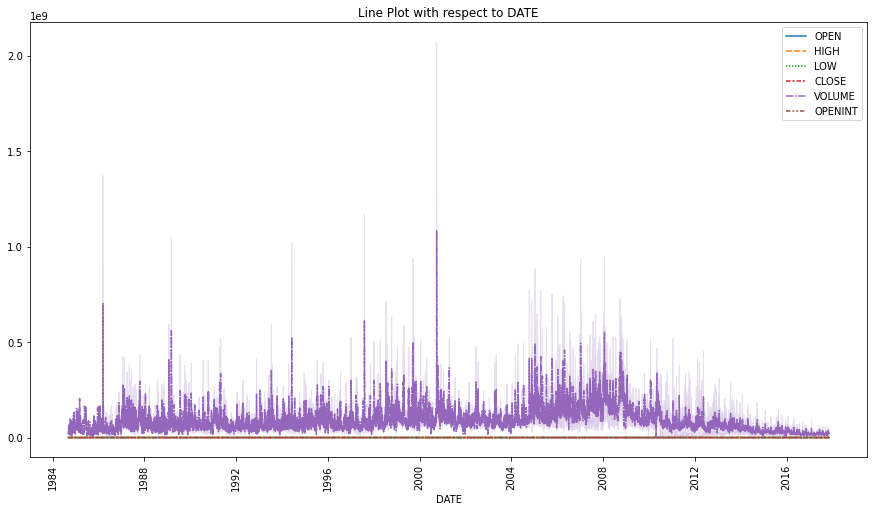

In [29]:
# line plot w.r.t DATE

d2 = d2.reset_index()              
d2 = d2.set_index('DATE')
plt.figure(figsize=(15,8))
sns.lineplot(data = d2)
plt.xticks(rotation = 90)
plt.title('Line Plot with respect to DATE')
plt.xlabel("DATE")


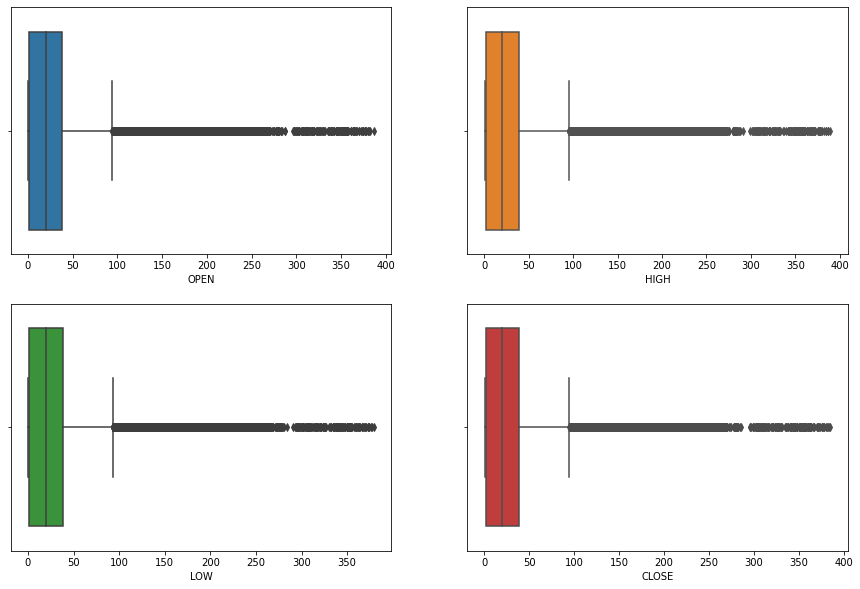

In [30]:
#creating Box plots of various attributes

plt.figure(figsize=(15,10))         
for i in enumerate(feature):
    plt.subplot(2,2,i[0]+1)
    base_color = sns.color_palette()[i[0]]
    sns.boxplot(x = d2[i[1]] , color = base_color)
    plt.xlabel(i[1]);

<AxesSubplot:>

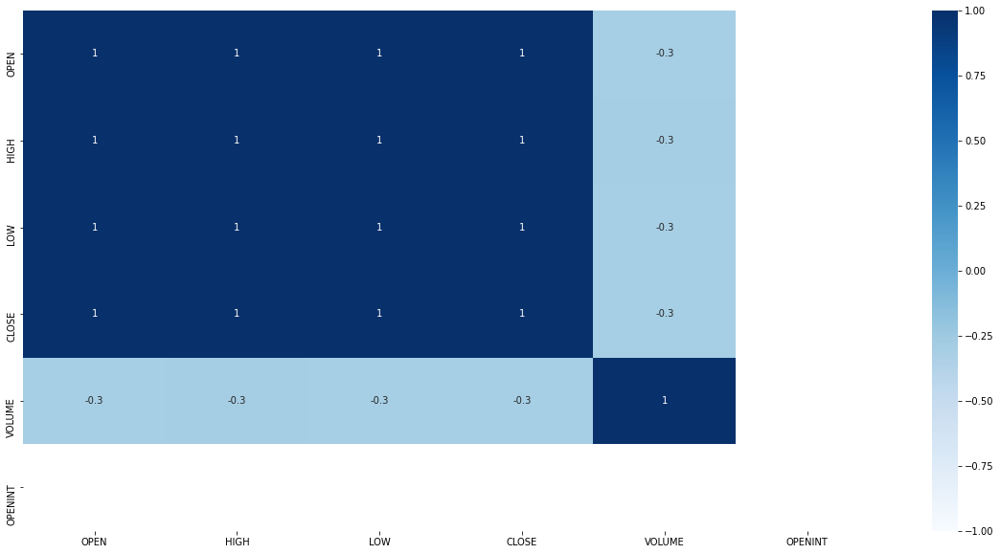

In [31]:
#heat map to determine correlation

sns.heatmap(d2.corr() , vmin = -1 , vmax = 1 , annot = True , cmap = 'Blues')     

In [32]:
#Candlestick plot

fig = go.Figure(data=[go.Candlestick(x=df1['DATE'],
                open=df1['OPEN'],
                high=df1['HIGH'],
                low=df1['LOW'],
                close=df1['CLOSE'])])

fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

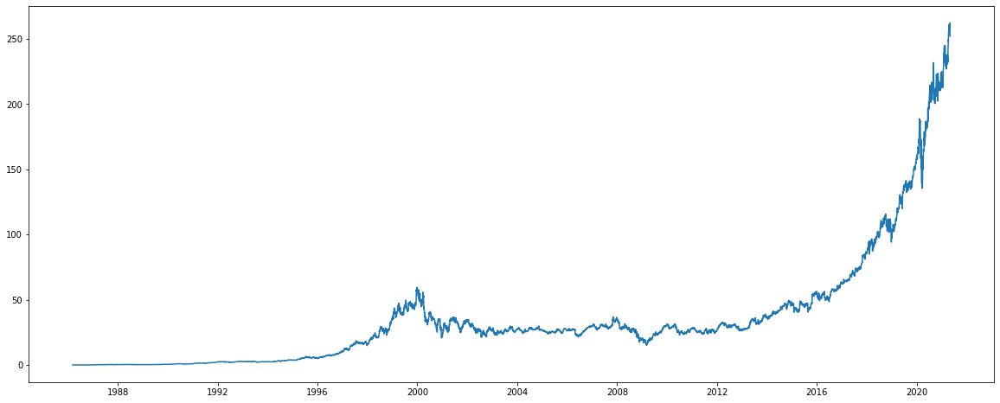

In [33]:
#Analyze the closing prices from MSFT data:

df.index=df['DATE']
plt.figure(figsize=(20,8))
plt.plot(df["CLOSE"],label='Close Price history')

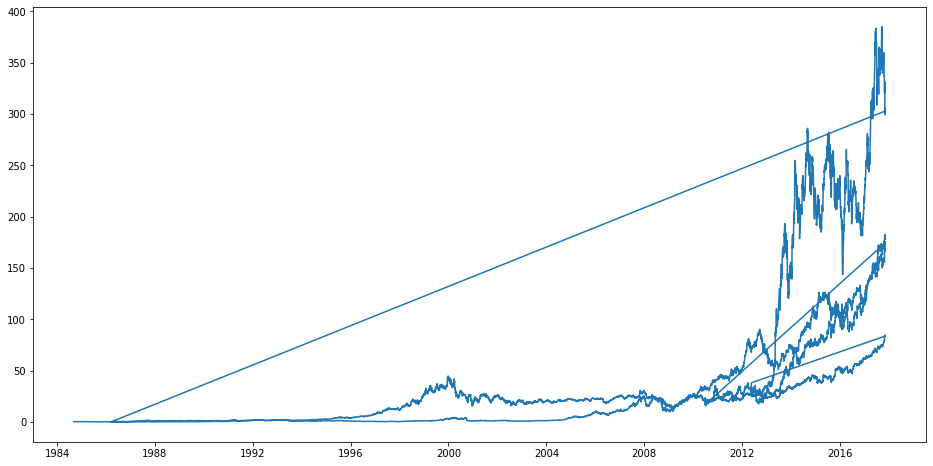

In [34]:
#Analyze the closing prices from Stock_data:

df1.index=df1['DATE']
plt.figure(figsize=(16,8))
plt.plot(df1["CLOSE"],label='Close Price history')

In [35]:
#Sort the dataset on date time and filter “Date” and “Close” columns:

data=df.sort_index(ascending=True,axis=0)
new_dataset=pd.DataFrame(index=range(0,len(df)),columns=['DATE','CLOSE'])
for i in range(0,len(data)):
    new_dataset["DATE"][i]=data['DATE'][i]
    new_dataset["CLOSE"][i]=data["CLOSE"][i]

In [36]:
#Normalize the new filtered dataset:

scaler=MinMaxScaler(feature_range=(0,1))
final_dataset=new_dataset.values
train_data=final_dataset[0:987,:]
valid_data=final_dataset[987:,:]
new_dataset.index=new_dataset.DATE
new_dataset.drop("DATE",axis=1,inplace=True)
scaler=MinMaxScaler(feature_range=(0,1))
scaled_data=scaler.fit_transform(new_dataset)
x_train_data,y_train_data=[],[]
for i in range(60,len(train_data)):
    x_train_data.append(scaled_data[i-60:i,0])
    y_train_data.append(scaled_data[i,0])
    
x_train_data,y_train_data=np.array(x_train_data),np.array(y_train_data)
x_train_data=np.reshape(x_train_data,(x_train_data.shape[0],x_train_data.shape[1],1))

In [37]:
#Build and train the LSTM model:

lstm_model=Sequential()
lstm_model.add(LSTM(units=50,return_sequences=True,input_shape=(x_train_data.shape[1],1)))
lstm_model.add(LSTM(units=50))
lstm_model.add(Dense(1))

inputs_data=new_dataset[len(new_dataset)-len(valid_data)-60:].values
inputs_data=inputs_data.reshape(-1,1)
inputs_data=scaler.transform(inputs_data)

lstm_model.compile(loss='mean_squared_error',optimizer='adam')
lstm_model.fit(x_train_data,y_train_data,epochs=5,batch_size=2,verbose=2)


Epoch 1/5
464/464 - 17s - loss: 2.0203e-06
Epoch 2/5
464/464 - 13s - loss: 5.1772e-07
Epoch 3/5
464/464 - 13s - loss: 4.2829e-07
Epoch 4/5
464/464 - 13s - loss: 4.6473e-07
Epoch 5/5
464/464 - 13s - loss: 3.8246e-07


In [38]:
#Take a sample of a dataset to make stock price predictions using the LSTM model:

X_test=[]
for i in range(60,inputs_data.shape[0]):
    X_test.append(inputs_data[i-60:i,0])
X_test=np.array(X_test)

X_test=np.reshape(X_test,(X_test.shape[0],X_test.shape[1],1))
predicted_closing_price=lstm_model.predict(X_test)
predicted_closing_price=scaler.inverse_transform(predicted_closing_price)

In [39]:
# Save the LSTM model:
lstm_model.save("saved_model.h5")

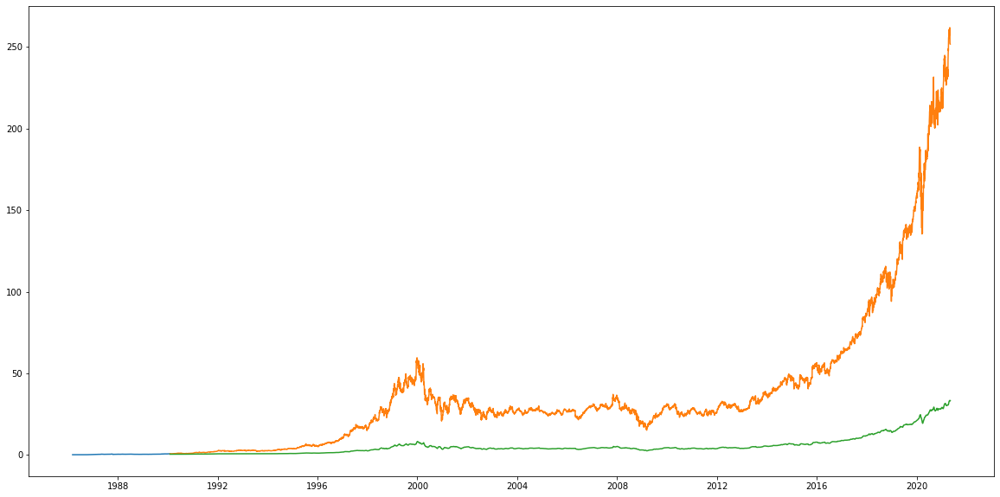

In [40]:
# Visualize the predicted stock costs with actual stock costs:
train_data=new_dataset[:987]
valid_data=new_dataset[987:]
valid_data['Predictions']=predicted_closing_price
plt.plot(train_data["CLOSE"])
plt.plot(valid_data[['CLOSE',"Predictions"]])
